In [1]:
import bokeh.plotting as bpl
import cv2
import glob
import logging
import matplotlib.pyplot as plt
import numpy as np
import os
import tifffile as tif
from time import time, sleep


try:
    cv2.setNumThreads(0)
except():
    pass

try:
    if __IPYTHON__:
        # this is used for debugging purposes only. allows to reload classes
        # when changed
        get_ipython().magic('load_ext autoreload')
        get_ipython().magic('autoreload 2')
except NameError:
    pass

import caiman as cm
from caiman.motion_correction import MotionCorrect
from caiman.source_extraction.cnmf import cnmf as cnmf
from caiman.source_extraction.cnmf import params as params
from caiman.utils.utils import download_demo
from caiman.utils.visualization import plot_contours, nb_view_patches, nb_plot_contour

from caiman.source_extraction import cnmf as cnmf
from scipy.sparse import csc_matrix
from scipy.signal import welch, fftconvolve
from scipy.interpolate import UnivariateSpline

from scipy.io import savemat, loadmat

from sklearn.decomposition import PCA
from sklearn import linear_model
from sklearn.metrics import r2_score

from scipy.ndimage.filters import gaussian_filter
from scipy.ndimage.interpolation import shift

from caiman.source_extraction.cnmf.utilities import extract_DF_F, detrend_df_f
from skimage.feature import register_translation
import skimage.transform

import pykalman as pk 
from matplotlib.colors import LogNorm

import pandas as pd

import h5py
bpl.output_notebook()



Loading BokehJS ...

In [10]:
# load in CaImAn output

#cmFile = 'C:/Users/bnste/Documents/scripts/jon_caiman_results/analysis_behavior_00001.hdf5'
#cmFile = 'C:/Users/bnste/Documents/scripts/caiman_results_red_structure.hdf5'
cmFile = '/gpfs/home/stetlb01/jon_test_caiman_rescale_out.hdf5'

def cellInfoCaimanHdf5(hdf5File, discarded=False):
    """
    Given a CaImAn output .hdf5 file, returns the spatial cell profiles, cell signal traces, and background profiles and traces
    Output:
    (cellProfs, signalTraces, bgProfs, bgTraces)
    cellProfs is a numCells x xDim x yDim array of spatial cell profiles
    signalTraces is a  tBins x numCells array of fluorescence traces from each cell
    bgProfs: nBGComps x xDim x yDim
    bgTraces: tBins x nBGComps
    """
    cellProfs = []
    signalTraces = []

    with h5py.File(hdf5File, mode='r') as cFile:
        if discarded:
            est = cFile['estimates/discarded_components']
        else:
            est = cFile['estimates']
        Ainfo = est['A']
        dims = np.array(cFile['dims'])
        signalTraces = np.transpose( np.array(est['C']) )
        Adata = np.array(Ainfo['data'])
        Aindices = np.array(Ainfo['indices'])
        Aindptr = np.array(Ainfo['indptr'])
        Ashape = np.array(Ainfo['shape'])
        A = csc_matrix((Adata,Aindices,Aindptr) , shape=Ashape ).transpose()
        A = np.array(A.todense())
        cellProfs = A.reshape((A.shape[0],np.array(dims)[0] ,-1))
        f = np.array(est['f']).transpose()
        if not discarded:
            b = np.array(est['b']).transpose()
            b = b.reshape(b.shape[0],cellProfs.shape[1],cellProfs.shape[2])
        else:
            b = None
    return (cellProfs, signalTraces, b, f)




# Caiman BG estimate
def getCaimanBg(startFrame=None,endFrame=None, mask=None, mode='caiman_only', origMov=None):
    """
    'mode' should be 'residual' (computed by subtracting caiman sources from origMov) or 'caiman_only' (directly from bg matrices) 
    """
    if mode not in ['residual', 'caiman_only']:
        raise Exception('mode must be caiman_only or residual')
    if (mode == 'residual') and (origMov is None):
        raise Exception('residual mode requires origMovie argument')
    if mask is None:
        if mode == 'caiman_only':
            return np.tensordot(b.transpose(0,2,1),f,axes=(0,1)).transpose((2,0,1))[startFrame:endFrame]
        elif mode == 'residual':
            return origMov - np.tensordot(C[startFrame:endFrame], A,  axes=(1,0)) 
    else:
        mask = mask / np.linalg.norm(mask)
        if mode == 'caiman_only':
            bMask = ( mask.reshape( (1,) + mask.shape ) * b ).sum(axis=(-2,-1))
            return np.tensordot(bMask,f,axes=(0,1)).transpose()[startFrame:endFrame]
        elif mode == 'residual':
            mask = mask.reshape( (1,) + mask.shape )
            return ( origMov * mask  ).sum(axis=(-2,-1)) - np.tensordot(C[startFrame:endFrame], (A.transpose((0,2,1)) * mask).sum(axis=(-2,-1)), axes=(1,0) )  

# return caiman movie from within the given frames, containing the given source and background indices
## UNFINISHED
def getCaimanMovie(startFrame=None, endFrame=None, source_indices='all', bg_indices='all'):
    source_indices = None if (source_indices == 'all') else np.array([0]) if (source_indices == 'none') else np.array(source_indices)
    bg_indices = None if (bg_indices == 'all') else np.array([0]) if (bg_indices == 'none') else np.array(bg_indices)

    sourceTerm = np.tensordot(C[startFrame:endFrame], A.transpose((0,2,1)),  axes=(1,0) )
        
# get trial average of array.
# time index should be in position 0.
def trialAvg(arr, trialSize, idxStart=0, idxEnd=None):
    if idxEnd is None:
        idxEnd = len(arr)
    inputLength = idxEnd - idxStart
    if (inputLength % trialSize) != 0:
        raise Exception('Input length {} incompatible with trial size {} (remainder {})'.format(inputLength, trialSize, inputLength % trialSize))
    arr = arr[idxStart:idxEnd]
    return arr.reshape((int(arr.shape[0]/trialSize),trialSize) + arr.shape[1:], order='C').mean(axis=0)


cnm = cnmf.cnmf.load_CNMF(cmFile)
if cnm.estimates.dims is None:
    cnm.estimates.dims = (256,256)
elif len(cnm.estimates.dims)==1:
    cnm.estimates.dims = cnm.estimates.dims*2
    
A, C, b, f = cellInfoCaimanHdf5(cmFile)

Adis, Cdis, _ , _ = cellInfoCaimanHdf5(cmFile, discarded=True)



OSError: Unable to open file (unable to open file: name = '/gpfs/home/stetlb01/jon_test_caiman_rescale_out.hdf5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [4]:
# inspect parameters from output (data, init, and quality are usually the most relevant)

for ptype in ['data','init', 'quality', 'motion', 'temporal', 'spatial']:
    print('{} parameters'.format(ptype))
    for (key,val) in cnm.params.get_group(ptype).items(): print('\t',key, ':', val)


data parameters
	 decay_time : 1.5
	 dims : None
	 dxy : (2, 2)
	 fnames : None
	 fr : 6
	 var_name_hdf5 : mov
init parameters
	 K : 8
	 alpha_snmf : 1000.0
	 center_psf : False
	 gSig : [3 3]
	 gSiz : [13 13]
	 init_iter : 2
	 kernel : None
	 maxIter : 5
	 max_iter_snmf : 500
	 method_init : greedy_roi
	 min_corr : 0.6
	 min_pnr : 6
	 nIter : 5
	 nb : 1
	 normalize_init : True
	 options_local_NMF : None
	 perc_baseline_snmf : 20
	 ring_size_factor : 1.4
	 rolling_length : 100
	 rolling_sum : True
	 sigma_smooth_snmf : (0.5, 0.5, 0.5)
	 ssub : 2
	 ssub_B : 2
	 tsub : 2
quality parameters
	 SNR_lowest : 0.5
	 cnn_lowest : 0.1
	 gSig_range : None
	 min_SNR : 1.5
	 min_cnn_thr : 0.99
	 rval_lowest : -1
	 rval_thr : 0.7
	 use_cnn : False
motion parameters
	 border_nan : copy
	 gSig_filt : None
	 max_deviation_rigid : 3
	 max_shifts : (10, 10)
	 min_mov : None
	 niter_rig : 1
	 nonneg_movie : True
	 num_frames_split : 80
	 num_splits_to_process_els : [b'7' b'None']
	 num_splits_to_process_r

In [6]:
cnm.estimates.dims = (256,256)

In [9]:
cnm.estimates.nb_view_components(denoised_color='red', idx=cnm.estimates.idx_components)

In [7]:
cnm.estimates.nb_view_components(denoised_color='red', idx=cnm.estimates.idx_components)

In [12]:
cnm.estimates.A.shape

(65536, 118)

In [11]:
cnm.estimates.nb_view_components(denoised_color='red', idx=cnm.estimates.idx_components)

{'A': <262144x22 sparse matrix of type '<class 'numpy.float64'>'
 	with 15729 stored elements in Compressed Sparse Column format>,
 'A_thr': None,
 'Ab': None,
 'Ab_dense': None,
 'AtA': None,
 'AtY_buf': None,
 'C': array([[ 5361.54295273,  5361.54295273,  5361.54295273, ...,
         18698.87164209, 18140.53183414, 17600.3905045 ],
        [21620.3390378 , 23576.16723035, 23450.51517176, ...,
         24612.83099107, 24336.43636865, 23875.09925227],
        [ 4365.1907198 ,  4365.1907198 ,  4365.1907198 , ...,
          4365.1907198 ,  4365.1907198 ,  4365.1907198 ],
        ...,
        [29082.18671295, 30686.98276072, 30310.3213411 , ...,
         23973.88592976, 23548.51985692, 23140.52861788],
        [19482.6110229 , 21475.83265817, 21616.53055687, ...,
         10996.06614885, 10992.9031497 , 10989.87046519],
        [19322.72288377, 21247.02353192, 23457.4212515 , ...,
         18023.16246933, 17773.75074056, 17534.84747666]]),
 'CC': None,
 'CY': None,
 'C_on': None,
 'Cf': N

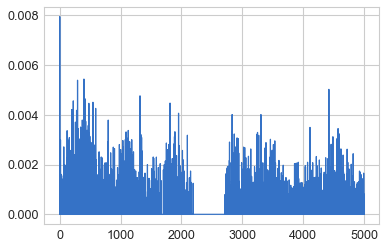

In [5]:
cellIdx = 0
plt.plot(cnm.estimates.S[cellIdx])
cnm.estimates.discarded_components

Top-Ranking indices: [118, 61, 68, 76, 82, 31, 10, 2, 40, 80, 109, 4, 75, 92, 49, 84, 56, 8, 116, 13, 79, 12, 5, 22, 70, 63, 113, 45, 50, 114, 126, 21, 78, 39, 90, 123, 93, 25, 30, 19, 94, 23, 32, 52, 18, 7, 122, 73, 29, 108, 77, 105, 33, 64, 74, 41, 20, 28, 111, 6, 9, 112, 44, 36, 24, 51, 98, 54, 65, 124, 89, 110, 66, 127, 103, 101, 104, 57, 71, 120, 117, 85, 17, 81, 125, 60, 35, 121, 106, 86, 48, 115, 67, 42, 34, 96, 102, 107, 88, 72]


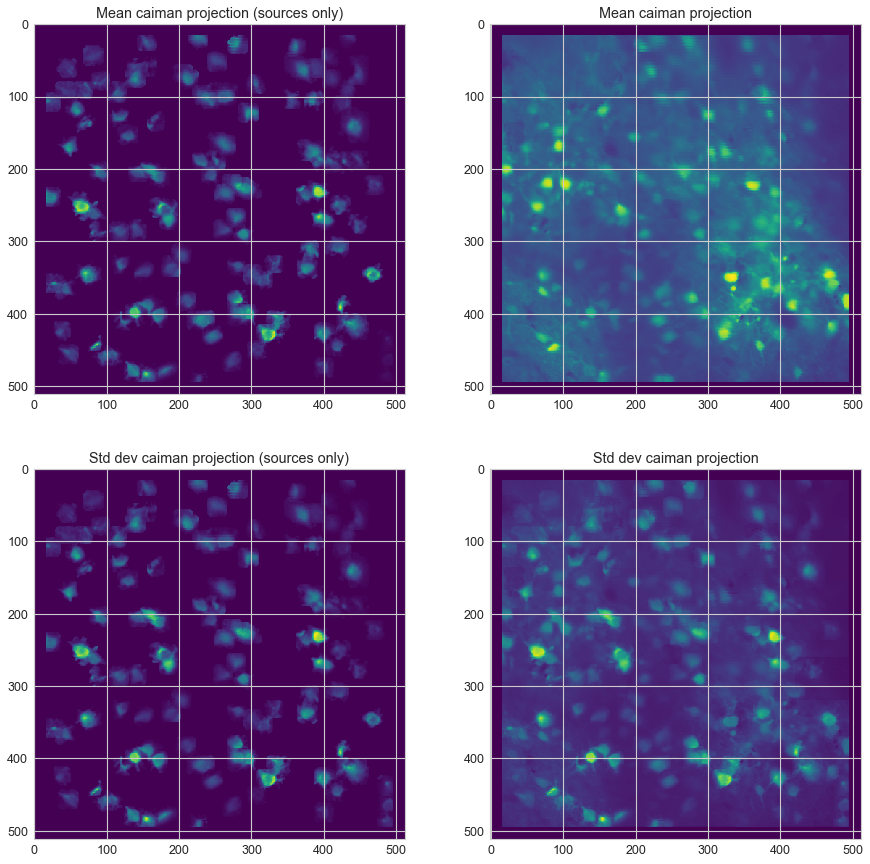

In [6]:
# rank indices by stddev of signal
%matplotlib inline
nSources=100
maskThresh=.6

meanImageSources = np.tensordot(C.mean(axis=0), A, axes=(0,0)).transpose().astype('float32')
meanImage = meanImageSources + np.tensordot(f.mean(axis=0), b, axes=(0,0)).transpose().astype('float32')

stdImageSources = np.tensordot(C.std(axis=0), A, axes=(0,0)).transpose().astype('float32')
stdImage = stdImageSources + np.tensordot(f.std(axis=0), b, axes=(0,0)).transpose().astype('float32')


# get top sources for consideration
stdSources = (C.std(axis=0))*(A.max(axis=(-1,-2)))
topRanks = np.argsort(stdSources)[-nSources:]


topPixels = (A[topRanks].transpose(0,2,1)).reshape(A[topRanks].shape[0],-1)
maskQuantiles = np.array([ np.percentile(x[x>0], maskThresh) for x in topPixels] ).reshape((len(topRanks),1,1))
masks = A[topRanks].transpose(0,2,1) > maskQuantiles

# get df/f traces for top sources
df_f = cnm.estimates.F_dff
df_f_top = cnm.estimates.F_dff[topRanks]

plt.figure(figsize=(15,15))
plt.subplot(2,2,1)
plt.imshow(meanImageSources)
plt.title('Mean caiman projection (sources only)')
plt.subplot(2,2,2)
plt.imshow(meanImage)
plt.title('Mean caiman projection')
plt.subplot(2,2,3)
plt.imshow(stdImageSources)
plt.title('Std dev caiman projection (sources only)')
plt.subplot(2,2,4)
plt.imshow(stdImage)
plt.title('Std dev caiman projection')

print('Top-Ranking indices: {}'.format(list(topRanks)))

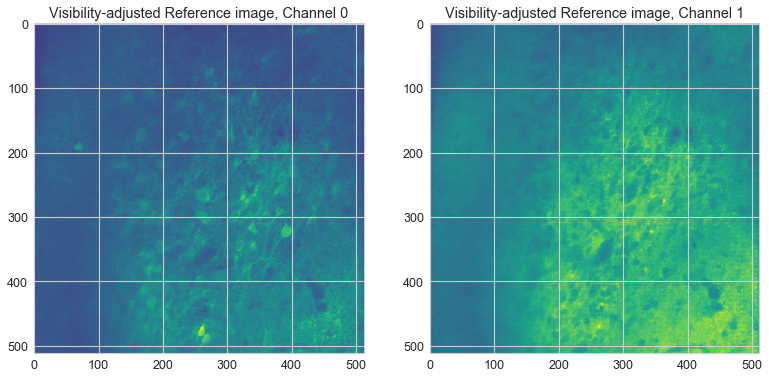

In [7]:
# load in reference image (if available)
refImgPth = r'C:\Users\bnste\Documents\scripts\jon_2p_data\JG1223\190426\JG1223_190426_field1_avg_00001_00001.tif'
try:
    refImg = tif.imread(refImgPth)
    plt.figure(figsize=(13,13))
    
    adjRefImg = (refImg - refImg.min(axis=(-1,-2), keepdims=True))/(refImg.max(axis=(-1,-2), keepdims=True) - refImg.min(axis=(-1,-2), keepdims=True))
    adjRefImg = np.power(adjRefImg, 1/3)
    if len(refImg.shape)==2:
        plt.imshow(refImg)
    else:
        nChannels = adjRefImg.shape[0]
        for i in range(nChannels):
            plt.subplot(1,nChannels,i+1)
            plt.imshow(adjRefImg[i])
            plt.title('Visibility-adjusted Reference image, Channel {}'.format(i))
except:
    print("Error reading reference image file")
    
# also  adjust caiman mean image similarly
adjMeanImage = np.power(meanImage, 1/3)

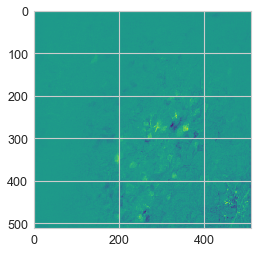

In [8]:
plt.imshow( meanImage - refImg[0]*meanImage.mean()/refImg[0].mean()  )

(2, 512, 512)

In [55]:
# load in mat file with stim locations

#stimFile = r'C:/Users/bnste/Documents/scripts/jon_2p_data/JG1223/190426/JG1223_190426_field1_all_2.mat'
stimFile = r'C:/Users/bnste/Documents/scripts/jon_2p_data/JG1223/190426/Analysis/JG1223_190426_00002_python_vars.mat'
stimMat = loadmat(stimFile)
#pattern = stimMat['pattern']
#Xcoordinates = stimMat['Xcoordinates'].flatten()
#Ycoordinates = stimMat['Ycoordinates'].flatten()
#xsave = stimMat['xsave'].flatten()
#ysave = stimMat['ysave'].flatten()
#sizesave = stimMat['sizesave'].flatten()
xsave = stimMat['xcoordsAll'].flatten()
ysave = stimMat['ycoordsAll'].flatten()
sizesave = stimMat['sizesAll'].flatten()


In [522]:
refShift, _, _ = register_translation(adjRefImg[0], adjMeanImage)
refShift = tuple(np.array(refShift,dtype=int))
refShift

(0, -5)

In [11]:
# utility for loading in pattern labels for trials
def getStimPatternSeq(hdf5File):
    import re
    with h5py.File(hdf5File,'r') as tempfile:
        trialList = list(tempfile['Trials'])
        patternSeq = np.array([ int(re.sub("[^0-9]", "", str(trial[2]))) -1 for trial in trialList])
    return patternSeq
    

Text(0.5,0,'stim #')

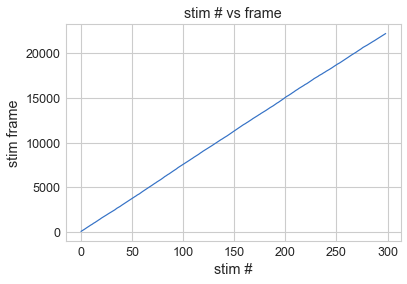

In [56]:
# load in stim info
exptInfoFile = r'C:/Users/bnste/Documents/scripts/jon_2p_data/JG1223/190426/Analysis/JG1223_190426_00002_python_vars.mat'
exptInfo= loadmat(exptInfoFile)
frameIdx = exptInfo['frameidx'].flatten() - 1
patternSeq = np.zeros_like(frameIdx, dtype='int8')-1
patternTrialsValid = exptInfo['patternTrialsValid'][0]
for i in range(len(patternTrialsValid)):
    patternTrialsValid[i] -= 1
    patternSeq[patternTrialsValid[i]] = i

    
    
## get stim pattern sequence
#patternSeqFile = r'C:/Users/bnste/Documents/scripts/jon_2p_data/JG1223/190426/1223_4_02_D2019_4_26T16_17_15.h5'
#patternSeq = getStimPatternSeq(patternSeqFile)
#patternSeq = patternSeq[:len(frameIdx)]


plt.plot(frameIdx)
plt.title('stim # vs frame')
plt.ylabel('stim frame')
plt.xlabel('stim #')

array([ 65. , 131. , 184. , 172. , 110. , 224. , 241. , 341.5, 360. ,
       397. , 387. , 387.5, 165. , 172. , 250. , 385. ,  19. ,  24. ,
         9. ,  78. , 246. , 377. , 449. , 502.5,  82. ,  10. ,  33. ,
        94. ,  51. , 461. , 461. ,  92. ,  74. ,  21. ,  71. , 302.5,
       448. ,  13. ,  10. , 446. , 455. , 430. , 330. , 189. ,  64. ,
       296.5])

In [70]:
# get median coordinates from caiman masks
Apos = np.where(A > 0)
Axmed = np.zeros(len(A))
Aymed = np.zeros(len(A))
for i in range(len(A)):
    Axmed[i] = np.median(Apos[1][Apos[0]==i])
    Aymed[i] = np.median(Apos[2][Apos[0]==i])

Aposdis = np.where(Adis > 0)
Axmeddis = np.zeros(len(Adis))
Aymeddis = np.zeros(len(Adis))
for i in range(len(Adis)):
    Axmeddis[i] = np.median(Aposdis[1][Aposdis[0]==i])
    Aymeddis[i] = np.median(Aposdis[2][Aposdis[0]==i])



In [76]:
## get lists of Caiman ROIs corresponding to stimulation sites

# calculate stimulation masks
indexGrid = np.indices(A.shape[1:])
stimPix =  ( (indexGrid[1:2] - xsave.reshape((-1,1,1)))**2 + (indexGrid[0:1] - ysave.reshape((-1,1,1)))**2 ) < (sizesave/2).reshape((-1,1,1))**2



## match ROIs
# threshold on dot product after 
thresh = -225
stimRoiMatches = []
for i, stimMask in enumerate(stimPix):
    #matchScores = (stimMask.reshape((-1,)+ stimMask.shape) * A.transpose(0,2,1)).sum(axis=(-1,-2)) / np.sqrt(stimMask.sum())
    matchScores = -(xsave[i] - Axmed)**2 - (ysave[i] - Aymed)**2
    maxInd = np.argmax(matchScores); maxScore = matchScores[maxInd]
    #if maxScore < thresh: maxInd = None
    if maxScore < thresh: maxInd = None
    stimRoiMatches += [maxInd]
    
# match ROIs on discarded Caiman components
disStimRoiMatches = []
for i, stimMask in enumerate(stimPix):
    if stimRoiMatches[i] is not None:
        disStimRoiMatches += [None]
        continue
    #matchScores = (stimMask.reshape((-1,)+ stimMask.shape) * Adis.transpose(0,2,1)).sum(axis=(-1,-2))/ np.sqrt(stimMask.sum())
    matchScores = -(xsave[i] - Axmeddis)**2 - (ysave[i] - Aymeddis)**2
    maxInd = np.argmax(matchScores); maxScore = matchScores[maxInd]
    if maxScore < thresh: maxInd = None
    disStimRoiMatches += [maxInd]

Text(0.5,0.98,'Stim file JG1223_190426_00002_python_vars.mat \n Caiman file JG1223_190426_00002_caiman_out.hdf5')

<Figure size 432x288 with 0 Axes>

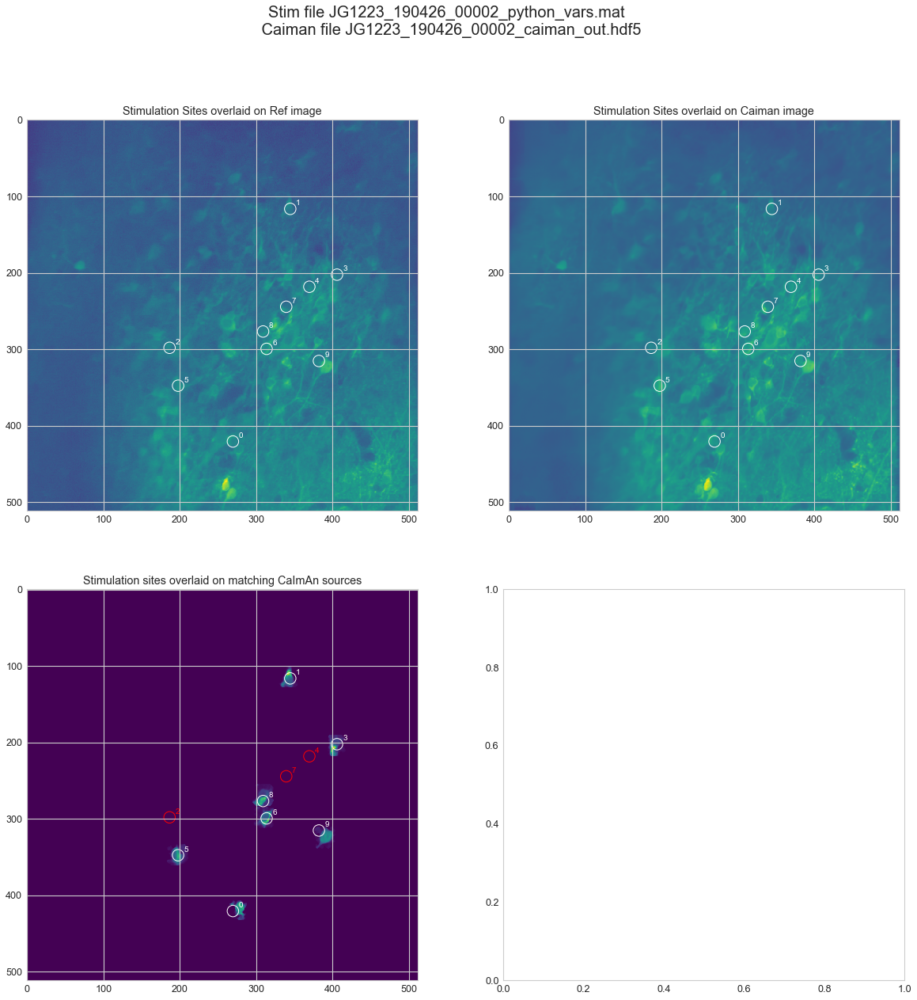

In [77]:
plt.figure();
fig,axgrid = plt.subplots(nrows=2, ncols=2, figsize=(20,20));
ax1, ax2, ax3, ax4 = axgrid.flatten()
ax1.imshow(adjRefImg[0])
ax2.imshow(adjMeanImage)
for i in range(len(xsave)):
    c = plt.Circle((xsave[i],ysave[i]), radius=sizesave[i]/2, fill=False, color='white', alpha=1, lw=1)
    ax1.add_patch(c)
    ax1.text(xsave[i]+sizesave[i]/2, ysave[i]-sizesave[i]/3,'{}'.format(i), color='white')
ax1.set_title('Stimulation Sites overlaid on Ref image');
for i in range(len(xsave)):
    c = plt.Circle((xsave[i],ysave[i]), radius=sizesave[i]/2, fill=False, color='white', alpha=1, lw=1)
    ax2.text(xsave[i]+sizesave[i]/2, ysave[i]-sizesave[i]/3,'{}'.format(i), color='white')
    ax2.add_patch(c)
ax2.set_title('Stimulation Sites overlaid on Caiman image');


pltImg = np.zeros(A.shape[1:])
for i in range(len(xsave)):
    if stimRoiMatches[i] is not None:
        pltImg += A[stimRoiMatches[i]]
        pltColor = 'white'
    elif disStimRoiMatches[i] is not None:
        pltImg += Adis[disStimRoiMatches[i]]
        pltColor = 'orange'
    else:
        pltColor='red'
    c = plt.Circle((xsave[i],ysave[i]), radius=sizesave[i]/2, fill=False, color=pltColor, alpha=1, lw=1)
    ax3.add_patch(c)
    ax3.text(xsave[i]+sizesave[i]/2, ysave[i]-sizesave[i]/3,'{}'.format(i), color=pltColor)
pltImg = pltImg.transpose()
ax3.imshow(pltImg)
plt.grid(None)
ax3.set_title('Stimulation sites overlaid on matching CaImAn sources')
fig.suptitle('Stim file {} \n Caiman file {}'.format(os.path.basename(stimFile),os.path.basename(cmFile)),size=20)

#######


# ymin, ymax = (-.05, .2)
# # create stim time rectangle mask
# rectCorner = (-preRemove-1,ymin)
# rectW = preRemove + postRemove+1
# rectH = ymax - ymin

# lineList1 = ax4.plot(frameWindowShift,thisAvgDff.transpose())
# rect = plt.Rectangle(rectCorner,width=rectW, height=rectH, color='gray', zorder=100)
# [line.set_label('Stim label {}, ROI {}'.format(goodStims[n], stimRoiMatches[goodStims[n]])) for (n,line) in enumerate(lineList1)]
# ax4.add_patch(rect)
# ax4.set_xlabel('Frames relative to stim time')
# ax4.set_ylabel('Stim-averaged DF/F')
# ax4.set_title('Average DF/F profile surrounding corresponding stim times', size=20)
# ax4.set_ylim((ymin,ymax))
# ax4.legend()


In [92]:
frameWindowShift

array([-15, -14, -13, -12, -11, -10,  -9,  -8,  -7,  -6,  -5,  -4,  -3,
        -2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,  14])

In [87]:
# calculate stim-averaged DF/F profiles for all stim regions with a good CaImAn match (above threshold match with non-discarded region)
# include 2 plots, for that cell's stim trials and all other stim trials

preStim = 15
postStim = 15
preRemove = 1 # remove pre/post stim frames to elim artifacts
postRemove = 3

goodStims = np.array([n for n,x in enumerate(stimRoiMatches) if x is not None])

frameWindowShift = np.delete( np.arange(-preStim, postStim), preStim + np.arange(-preRemove,postRemove))
thisAvgDff = np.empty((len(goodStims), len(frameWindowShift)))
notThisAvgDff = np.empty((len(goodStims), len(frameWindowShift)))
preMeans = np.empty((len(goodStims),))
postMeans = np.empty((len(goodStims),))

for n,stimIdx in enumerate(goodStims):
    roiIdx = stimRoiMatches[stimIdx]
    thisStim = (patternSeq == stimIdx)
    notThisStim = ~(thisStim)
    thisStimWindows = frameIdx[thisStim].reshape(-1,1) + frameWindowShift.reshape(1,-1)
    notThisStimWindows = frameIdx[notThisStim].reshape(-1,1) + frameWindowShift.reshape(1,-1)
    thisAvgDff[n] = df_f[roiIdx, thisStimWindows].mean(axis=0) 
    notThisAvgDff[n] = df_f[roiIdx, notThisStimWindows].mean(axis=0)
    preMeans[n] = df_f[roiIdx, thisStimWindows][:,frameWindowShift < 0].mean() 
    postMeans[n] = df_f[roiIdx, thisStimWindows][:,frameWindowShift > 0].mean() 


Text(0.5,1,'Average DF/F profile surrounding non-corresponding stim times')

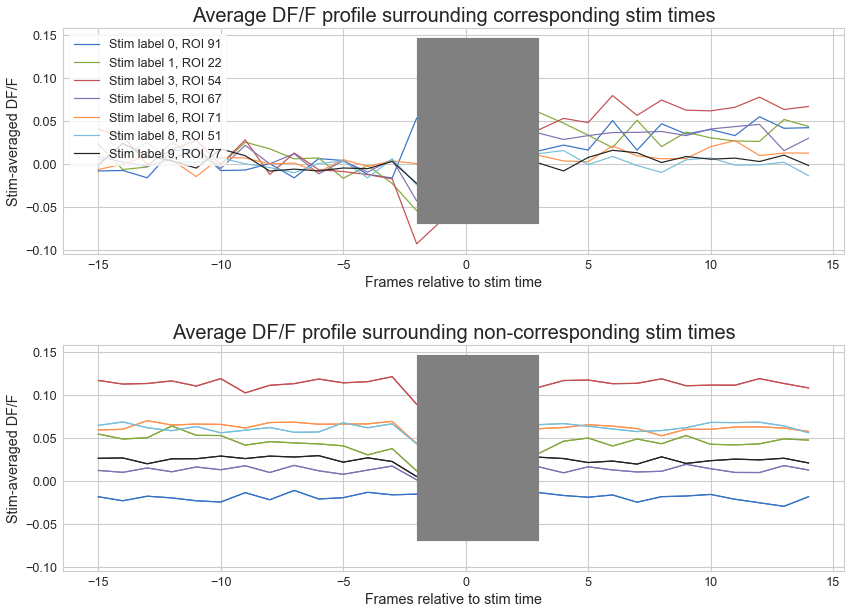

In [91]:
fig,(ax1,ax2) = plt.subplots(2, figsize=(14,10), sharey=True) 
plt.subplots_adjust(hspace=.4)

# create stim time rectangle mask
rectCorner = (-preRemove-1,min(thisAvgDff.min(), notThisAvgDff.min()))
rectW = preRemove + postRemove+1
rectH = max(thisAvgDff.max(), notThisAvgDff.max() )- min(thisAvgDff.min(), notThisAvgDff.min())

lineList1 = ax1.plot(frameWindowShift,(thisAvgDff - preMeans.reshape((-1,1))).transpose())
rect = plt.Rectangle(rectCorner,width=rectW, height=rectH, color='gray', zorder=100)
[line.set_label('Stim label {}, ROI {}'.format(goodStims[n], stimRoiMatches[goodStims[n]])) for (n,line) in enumerate(lineList1)]
ax1.add_patch(rect)
ax1.set_xlabel('Frames relative to stim time')
ax1.set_ylabel('Stim-averaged DF/F')
ax1.set_title('Average DF/F profile surrounding corresponding stim times', size=20)
ax1.legend(loc=2)


ax2.plot(frameWindowShift,notThisAvgDff.transpose())
lineList2 = ax2.plot(frameWindowShift,notThisAvgDff.transpose())
[l.set_color(lineList1[n].get_color()) for (n,l) in enumerate(lineList2)]
[line.set_label('Stim label {}, ROI {}'.format(goodStims[n], stimRoiMatches[goodStims[n]])) for (n,line) in enumerate(lineList2)]
rect = plt.Rectangle(rectCorner,width=rectW, height=rectH, color='gray', zorder=100)
ax2.add_patch(rect)
ax2.set_xlabel('Frames relative to stim time')
ax2.set_ylabel('Stim-averaged DF/F')
ax2.set_title('Average DF/F profile surrounding non-corresponding stim times', size=20)

Text(0.5,1,'non-corresponding stim/response')

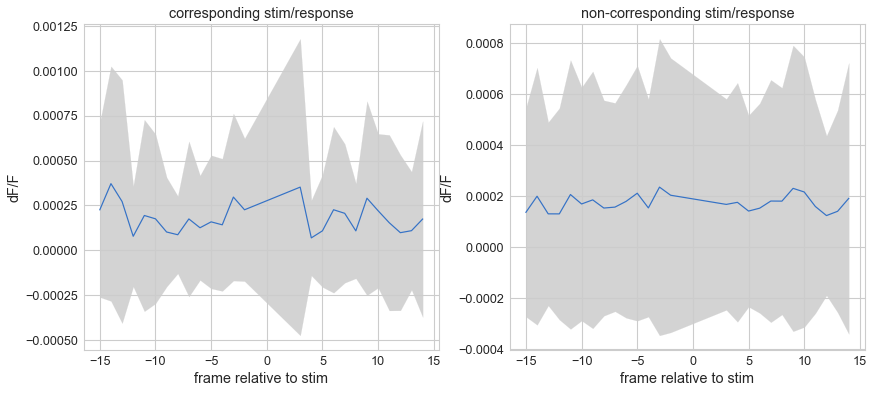

In [80]:
stimIdx=goodStims[5]
roiIdx = stimRoiMatches[stimIdx]
thisStim = (patternSeq == stimIdx)
notThisStim = ~(thisStim)
thisStimWindows = frameIdx[thisStim].reshape(-1,1) + frameWindowShift.reshape(1,-1)
notThisStimWindows = frameIdx[notThisStim].reshape(-1,1) + frameWindowShift.reshape(1,-1)
# myAvgDff = df_f[roiIdx, thisStimWindows].mean(axis=0)
# myStdDff = df_f[roiIdx, thisStimWindows].std(axis=0)
# notMyAvgDff = df_f[roiIdx, notThisStimWindows].mean(axis=0)
# notMyStdDff = df_f[roiIdx, notThisStimWindows].std(axis=0)

myAvgDff = cnm.estimates.S[roiIdx, thisStimWindows].mean(axis=0)
myStdDff = cnm.estimates.S[roiIdx, thisStimWindows].std(axis=0)
notMyAvgDff = cnm.estimates.S[roiIdx, notThisStimWindows].mean(axis=0)
notMyStdDff = cnm.estimates.S[roiIdx, notThisStimWindows].std(axis=0)


plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
plt.fill_between(frameWindowShift, myAvgDff - myStdDff, myAvgDff + myStdDff, color='lightgray')
plt.plot(frameWindowShift,myAvgDff)
#plt.ylim((-.15,.15))
plt.xlabel('frame relative to stim')
plt.ylabel('dF/F')
plt.title('corresponding stim/response')


plt.subplot(1,2,2)
plt.fill_between(frameWindowShift, notMyAvgDff - notMyStdDff, notMyAvgDff + notMyStdDff, color='lightgray')
plt.plot(frameWindowShift,notMyAvgDff)
#plt.ylim((-.15,.15))
plt.xlabel('frame relative to stim')
plt.ylabel('dF/F')
plt.title('non-corresponding stim/response')

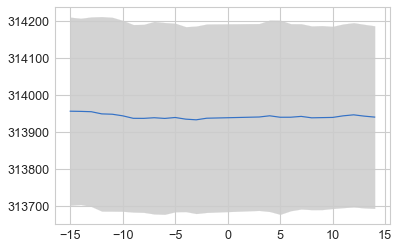

In [103]:
stimWindows = frameIdx.reshape(-1,1) + frameWindowShift.reshape(1,-1)
fWindowMean = f[stimWindows,1].mean(axis=0)
fWindowStd = f[stimWindows,1].std(axis=0)
plt.fill_between(frameWindowShift, fWindowMean - fWindowStd, fWindowMean + fWindowStd, color='lightgray')
plt.plot(frameWindowShift, fWindowMean)

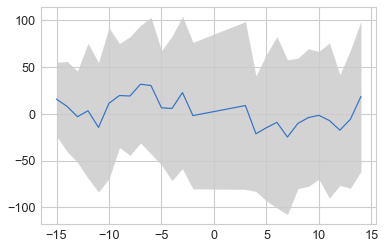

In [134]:
# check residuals
stimIdx=goodStims[4]
roiIdx = stimRoiMatches[stimIdx]
rTrace = cnm.estimates.YrA[roiIdx]
stimWindows = frameIdx.reshape(-1,1) + frameWindowShift.reshape(1,-1)
thisStimWindows = frameIdx[(patternSeq == stimIdx)].reshape(-1,1) + frameWindowShift.reshape(1,-1)
rWindowMean = rTrace[thisStimWindows].mean(axis=0)
rWindowStd = rTrace[thisStimWindows].std(axis=0)
plt.fill_between(frameWindowShift, rWindowMean - rWindowStd, rWindowMean + rWindowStd, color='lightgray')
plt.plot(frameWindowShift, rWindowMean)

(79, 512, 512)

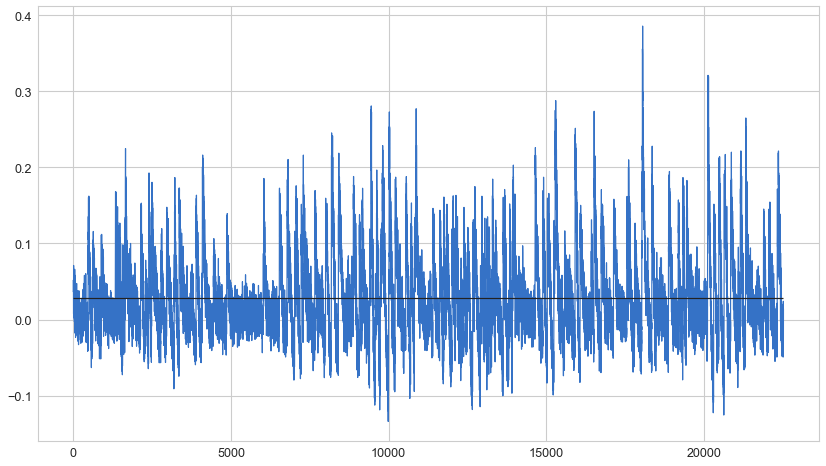

In [374]:
plt.figure(figsize=(14,8))
plt.plot(df_f[107])
plt.hlines(df_f[107].mean(),xmin=0, xmax = len(df_f[87]), zorder=100)

In [93]:
# calculate stim-averaged DF/F profiles for all non-discarded CaImAn regions wrt different stims

preStim = 15
postStim = 15
preRemove = 1 # remove pre/post stim frames to elim artifacts
postRemove = 3

frameWindowShift = np.delete( np.arange(-preStim, postStim), preStim + np.arange(-preRemove,postRemove))
avgDff = np.empty( (max(patternSeq)+1, len(df_f), len(frameWindowShift)))


for stimIdx in range(len(avgDff)):
    stim = (patternSeq == stimIdx)
    stimWindows = frameIdx[stim].reshape(-1,1) + frameWindowShift.reshape(1,-1)
    avgDff[stimIdx] = df_f[:, stimWindows].mean(axis=1)
    
# calculate differences between mean pre- and post-stim df_f for all (stim, ROI) pairs:
preMeans = avgDff[:,:, frameWindowShift < 0].mean(axis=-1)
postMeans = avgDff[:,:, frameWindowShift > 0].mean(axis=-1)
prePostDiff = postMeans - preMeans

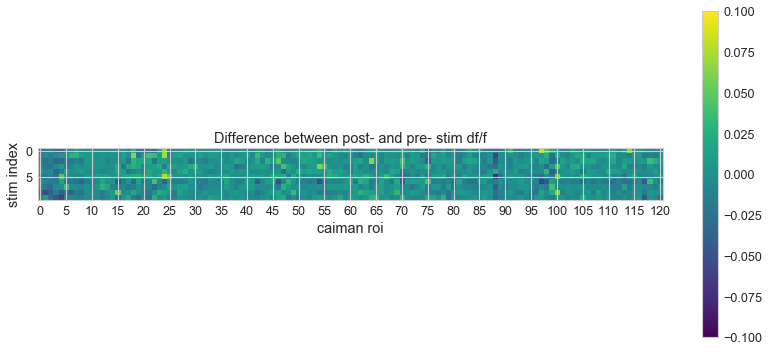

In [94]:
plt.figure(figsize=(14,6))
plt.xticks(np.arange(0,prePostDiff.shape[1], 5))
plt.imshow(prePostDiff, vmax=.1, vmin=-.1)
plt.title('Difference between post- and pre- stim df/f')
plt.xlabel('caiman roi')
plt.ylabel('stim index')
plt.colorbar()

In [ ]:
# get response-triggered averages for different caiman regions

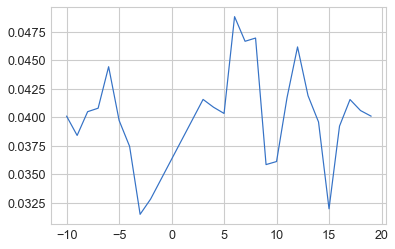

In [385]:
plt.plot(frameWindowShift,avgDff[2,107,:].transpose())

Text(0.5,1,'Top-DF/F Interior Sources')

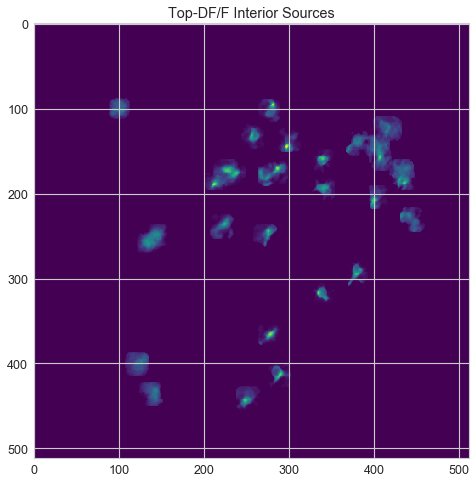

In [96]:
# get A indices with masks intersecting the middle of the frame
borderSize=75
interiorInds = np.array(np.where(  A[:,borderSize:-borderSize, borderSize:-borderSize].sum(axis=(-1,-2)) >0  )).flatten()


maxDffInds = interiorInds[np.argsort(df_f[interiorInds].max(axis=-1))[-30:]]

plt.figure(figsize=(8,8))
plt.imshow(A[maxDffInds].sum(axis=0).transpose())
plt.title('Top-DF/F Interior Sources')



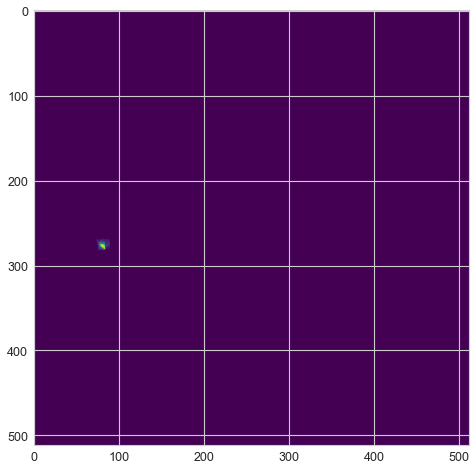

In [468]:
i=-25
plt.figure(figsize=(8,8))
plt.imshow(A[maxDffInds[i]])

In [97]:
# snr for these good components
np.sort(cnm.estimates.SNR_comp[maxDffInds])

array([1.15141258, 1.49563107, 2.02572171, 2.11911684, 2.12126211,
       2.21836038, 2.21850347, 2.24933137, 2.26931199, 2.32231302,
       2.34994628, 2.36864438, 2.45647427, 2.50310133, 2.50930489,
       2.51053519, 2.7588542 , 2.79078206, 2.84363846, 2.97205493,
       3.63295352, 3.67671183, 3.81309208, 4.0632201 , 4.14783701,
       4.34871312, 4.59871477, 5.22271752, 5.99821208, 8.28053222])

array([0.        , 0.        , 0.00640207, ..., 0.        , 0.        ,
       0.        ])

# Movies

In [98]:
def playMovie(mov,scale=True ,clip=True, trimStd=6, bord_px = 0, cmap='rainbow', magnification = 1., plot_text = True, fr=30, interpolation=cv2.INTER_LINEAR):
        
        if clip:
            movStd = mov.std()
            movMean = mov.mean()
            mov = np.clip(mov,movMean - trimStd*movStd, movMean + trimStd*movStd )
        
        
        if scale:
            mov = (mov - mov.min())/(mov.max() - mov.min()) 
    

        looping = True
        terminated = False
        
        cmap = plt.get_cmap(cmap)

        while looping:

            for iddxx, frame in enumerate(mov):
                
                frame = np.delete(cmap(frame, bytes=False),3,2)[...,::-1]
                #frame = cmap(frame, bytes=False)
                
                if bord_px is not None and np.sum(bord_px) > 0:
                    frame = frame[bord_px:-bord_px, bord_px:-bord_px]

                if True:
                    if magnification != 1:
                        frame = cv2.resize(
                            frame, None, fx=magnification, fy=magnification, interpolation=interpolation)

                    if plot_text == True:
                        text_width, text_height = cv2.getTextSize('Frame = ' + str(iddxx), fontFace=5, fontScale = 0.8, thickness=1)[0]
                        cv2.putText(frame, 'Frame = ' + str(iddxx), ((frame.shape[1] - text_width) // 2,
                                    frame.shape[0] - (text_height + 5)), fontFace=5, fontScale=0.8, color=(255, 255, 255), thickness=1)

                    cv2.imshow('frame', frame )

                    if cv2.waitKey(int(1. / fr * 1000)) & 0xFF == ord('q'):
                        looping = False
                        terminated = True
                        break
                        
        cv2.destroyAllWindows()

In [99]:
indStart = 0
indEnd = 500
mov = (np.tensordot(C[indStart:indEnd], A, (-1,0) ) + np.tensordot(f[indStart:indEnd],b,(-1,0))).transpose((0,2,1))



In [100]:
playMovie( mov , fr=15, magnification=2, trimStd=4, bord_px=10)

In [108]:
tmppth = r'C:\Users\bnste\Documents\scripts\jon_2p_data\JG9672\190220\Ref.tif'
tmp = tif.imread(tmppth)
tif.imsave(file=tmppth,data=tmp, imagej=True)

In [ ]:
cnm.estimatesstimatesstimatesstimates